<a href="https://colab.research.google.com/github/durgaprasaddp72/Loan_Default_Prediction/blob/main/LoanDefaultprediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [73]:
!pip install ydata_profiling

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()

import shap

# To scale the data using Standard Scaler
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

# Algorithms to use
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import classification_report, precision_recall_curve, recall_score, precision_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix

import scipy.stats as stats

# For tuning the model
from sklearn.model_selection import GridSearchCV

# To ignore warnings
import warnings
warnings.filterwarnings("ignore")

## data overview

In [75]:
df=pd.read_csv("hmeq.csv")

In [76]:
df.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
0,1,1100,25860.0,39025.0,HomeImp,Other,10.5,0.0,0.0,94.366667,1.0,9.0,NaN
1,1,1300,70053.0,68400.0,HomeImp,Other,7.0,0.0,2.0,121.833333,0.0,14.0,NaN
2,1,1500,13500.0,16700.0,HomeImp,Other,4.0,0.0,0.0,149.466667,1.0,10.0,NaN
3,1,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,1700,97800.0,112000.0,HomeImp,Office,3.0,0.0,0.0,93.333333,0.0,14.0,NaN


In [77]:
data=df.copy()

In [78]:
data.tail()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC
5955,0,88900,57264.0,90185.0,DebtCon,Other,16.0,0.0,0.0,221.808718,0.0,16.0,36.112347
5956,0,89000,54576.0,92937.0,DebtCon,Other,16.0,0.0,0.0,208.692070,0.0,15.0,35.859971
5957,0,89200,54045.0,92924.0,DebtCon,Other,15.0,0.0,0.0,212.279697,0.0,15.0,35.556590
5958,0,89800,50370.0,91861.0,DebtCon,Other,14.0,0.0,0.0,213.892709,0.0,16.0,34.340882
5959,0,89900,48811.0,88934.0,DebtCon,Other,15.0,0.0,0.0,219.601002,0.0,16.0,34.571519


In [79]:
data.shape

(5960, 13)

In [80]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   BAD      5960 non-null   int64  
 1   LOAN     5960 non-null   int64  
 2   MORTDUE  5442 non-null   float64
 3   VALUE    5848 non-null   float64
 4   REASON   5708 non-null   object 
 5   JOB      5681 non-null   object 
 6   YOJ      5445 non-null   float64
 7   DEROG    5252 non-null   float64
 8   DELINQ   5380 non-null   float64
 9   CLAGE    5652 non-null   float64
 10  NINQ     5450 non-null   float64
 11  CLNO     5738 non-null   float64
 12  DEBTINC  4693 non-null   float64
dtypes: float64(9), int64(2), object(2)
memory usage: 605.4+ KB


In [81]:
"""from ydata_profiling import ProfileReport
report=ProfileReport(df)
report.to_file("profilereport.html")"""


'from ydata_profiling import ProfileReport\nreport=ProfileReport(df)\nreport.to_file("profilereport.html")'

In [82]:
report

In [83]:
data.isnull().sum()

,0
BAD,0
LOAN,0
MORTDUE,518
VALUE,112
REASON,252
JOB,279
YOJ,515
DEROG,708
DELINQ,580
CLAGE,308


In [84]:
(data.isnull().sum()/data.shape[0]*100)

,0
BAD,0.000000
LOAN,0.000000
MORTDUE,8.691275
VALUE,1.879195
REASON,4.228188
JOB,4.681208
YOJ,8.640940
DEROG,11.879195
DELINQ,9.731544
CLAGE,5.167785


In [85]:
cat_cols=["BAD"]
num_cols=[]
for col in df.columns:
  if df[col].dtype=="object":
    cat_cols.append(col)
  else:
    num_cols.append(col)


In [86]:
cat_cols

['BAD', 'REASON', 'JOB']

In [87]:
for col in cat_cols:
  df[col]=df[col].astype("category")

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5960 entries, 0 to 5959
Data columns (total 13 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   BAD      5960 non-null   category
 1   LOAN     5960 non-null   int64   
 2   MORTDUE  5442 non-null   float64 
 3   VALUE    5848 non-null   float64 
 4   REASON   5708 non-null   category
 5   JOB      5681 non-null   category
 6   YOJ      5445 non-null   float64 
 7   DEROG    5252 non-null   float64 
 8   DELINQ   5380 non-null   float64 
 9   CLAGE    5652 non-null   float64 
 10  NINQ     5450 non-null   float64 
 11  CLNO     5738 non-null   float64 
 12  DEBTINC  4693 non-null   float64 
dtypes: category(3), float64(9), int64(1)
memory usage: 483.7 KB


In [89]:
num_cols=[
 'LOAN',
 'MORTDUE',
 'VALUE',
 'YOJ',
 'DEROG',
 'DELINQ',
 'CLAGE',
 'NINQ',
 'CLNO',
 'DEBTINC']

In [90]:
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
LOAN,5960.0,18607.969799,11207.480417,1100.000000,11100.000000,16300.000000,23300.000000,89900.000000
MORTDUE,5442.0,73760.817200,44457.609458,2063.000000,46276.000000,65019.000000,91488.000000,399550.000000
VALUE,5848.0,101776.048741,57385.775334,8000.000000,66075.500000,89235.500000,119824.250000,855909.000000
YOJ,5445.0,8.922268,7.573982,0.000000,3.000000,7.000000,13.000000,41.000000
DEROG,5252.0,0.254570,0.846047,0.000000,0.000000,0.000000,0.000000,10.000000
DELINQ,5380.0,0.449442,1.127266,0.000000,0.000000,0.000000,0.000000,15.000000
CLAGE,5652.0,179.766275,85.810092,0.000000,115.116702,173.466667,231.562278,1168.233561
NINQ,5450.0,1.186055,1.728675,0.000000,0.000000,1.000000,2.000000,17.000000
CLNO,5738.0,21.296096,10.138933,0.000000,15.000000,20.000000,26.000000,71.000000
DEBTINC,4693.0,33.779915,8.601746,0.524499,29.140031,34.818262,39.003141,203.312149


In [91]:
df[cat_cols].describe().T

,count,unique,top,freq
BAD,5960,2,0,4771
REASON,5708,2,DebtCon,3928
JOB,5681,6,Other,2388


In [92]:
for col in cat_cols:
  print(f"unique values in the {col} are:")
  print(df[col].value_counts(normalize=True))
  print("="*60)

unique values in the BAD are:
BAD
0    0.800503
1    0.199497
Name: proportion, dtype: float64
unique values in the REASON are:
REASON
DebtCon    0.688157
HomeImp    0.311843
Name: proportion, dtype: float64
unique values in the JOB are:
JOB
Other      0.420349
ProfExe    0.224608
Office     0.166872
Mgr        0.135011
Self       0.033973
Sales      0.019187
Name: proportion, dtype: float64


## exploratory data analysys

What is the range of values for the loan amount variable "LOAN"?

How does the distribution of years at present job "YOJ" vary across the dataset?

How many unique categories are there in the REASON variable?

What is the most common category in the JOB variable?

Is there a relationship between the REASON variable and the proportion of applicants who defaulted on their loan?

Do applicants who default have a significantly different loan amount compared to those who repay their loan?

Is there a correlation between the value of the property and the loan default rate?

Do applicants who default have a significantly different mortgage amount compared to those who repay their loan?

## univariate analysys

In [93]:
def plot_pie(col):
  perc_default=df[col].value_counts()/len(df[col])
  print(f"the percentage of categories in {col}is: {perc_default*100}%")
  print(f"pie plot of {col}")
  plt.figure(figsize=(5,5))
  df[col].value_counts().plot(kind="pie",autopct="%1.1f%%")
  plt.show()



the percentage of categories in BADis: BAD
0    80.050336
1    19.949664
Name: count, dtype: float64%
pie plot of BAD


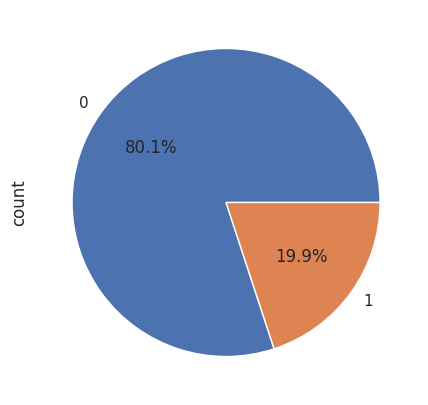

None
the percentage of categories in REASONis: REASON
DebtCon    65.906040
HomeImp    29.865772
Name: count, dtype: float64%
pie plot of REASON


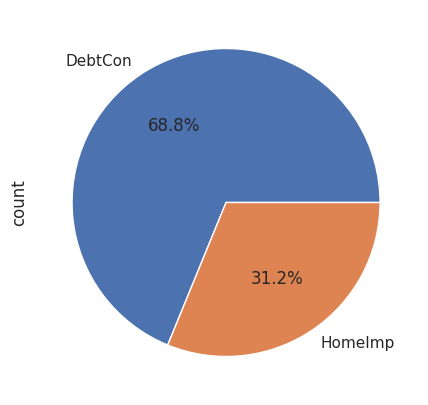

None
the percentage of categories in JOBis: JOB
Other      40.067114
ProfExe    21.409396
Office     15.906040
Mgr        12.869128
Self        3.238255
Sales       1.828859
Name: count, dtype: float64%
pie plot of JOB


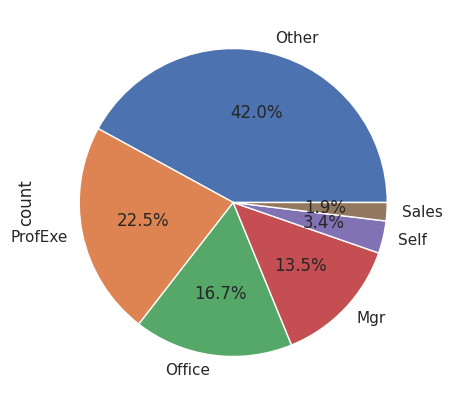

None


In [94]:
for col in cat_cols:
  print(plot_pie(col))

## histogram and boxplot for numerical values

the plots of the LOAN are:
Skew : 2.02


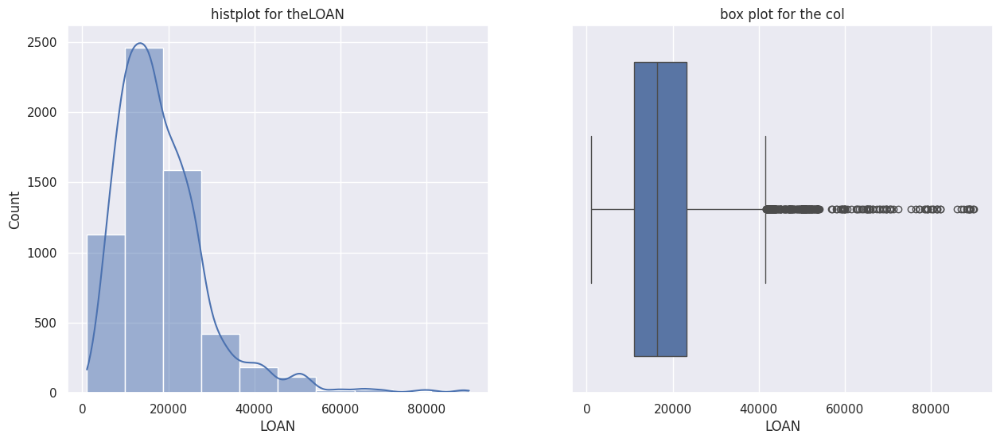

the plots of the MORTDUE are:
Skew : 1.81


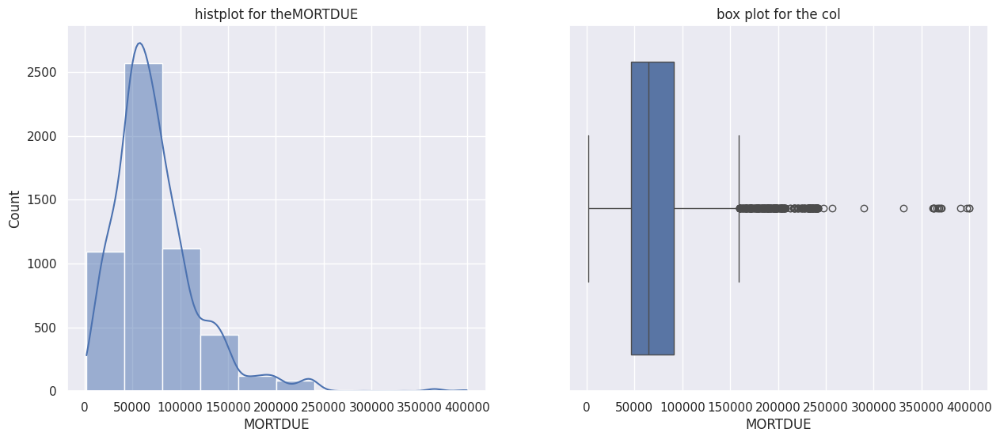

the plots of the VALUE are:
Skew : 3.05


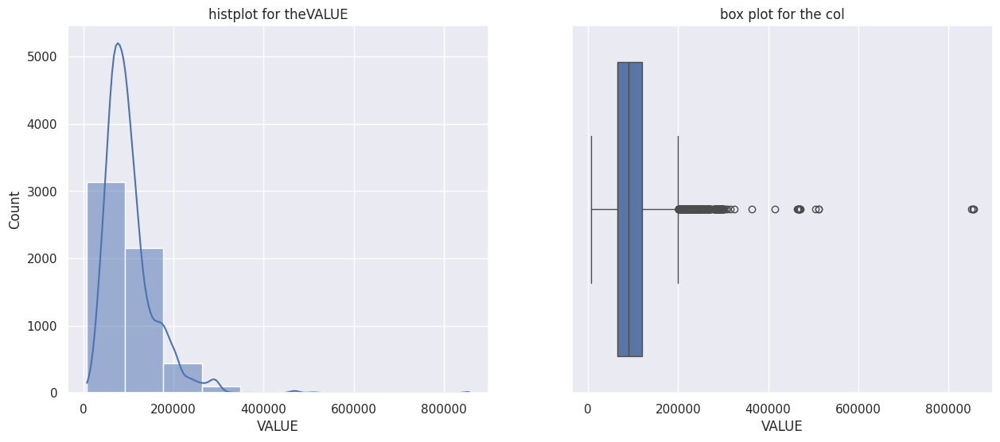

the plots of the YOJ are:
Skew : 0.99


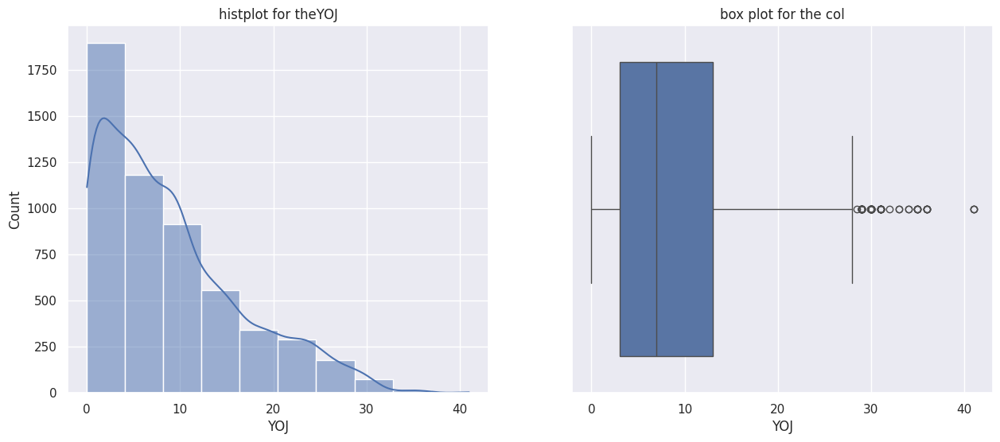

the plots of the DEROG are:
Skew : 5.32


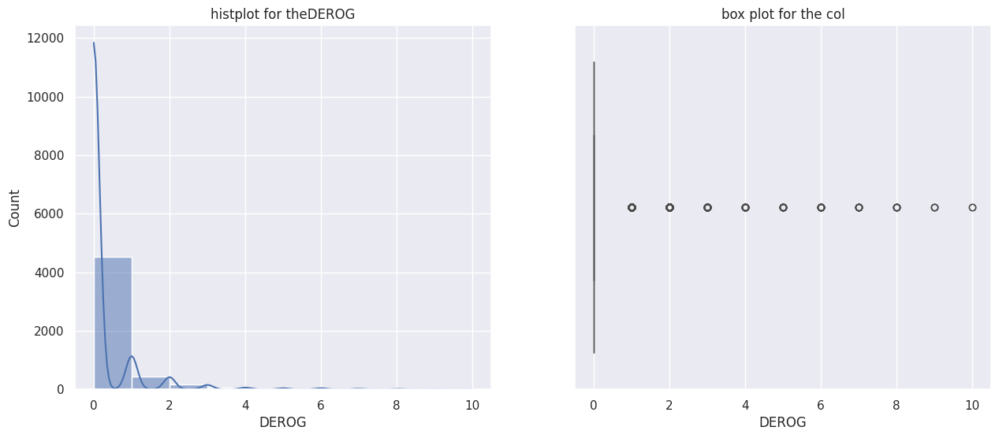

the plots of the DELINQ are:
Skew : 4.02


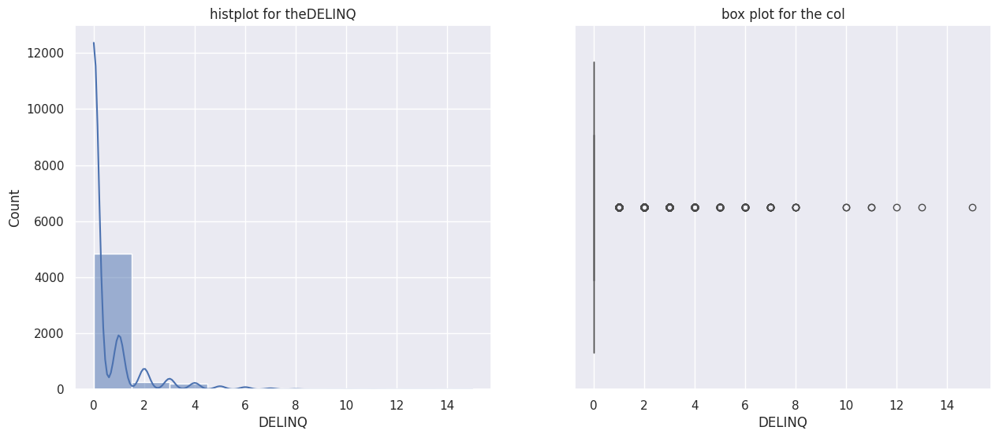

the plots of the CLAGE are:
Skew : 1.34


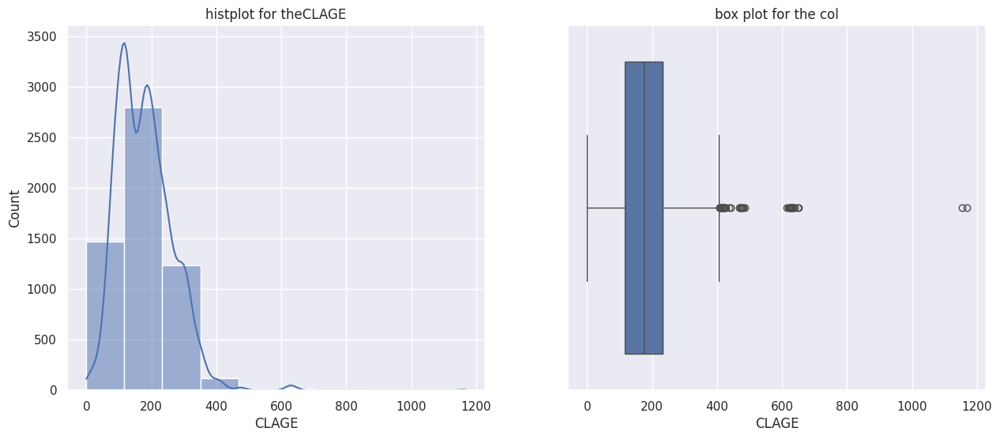

the plots of the NINQ are:
Skew : 2.62


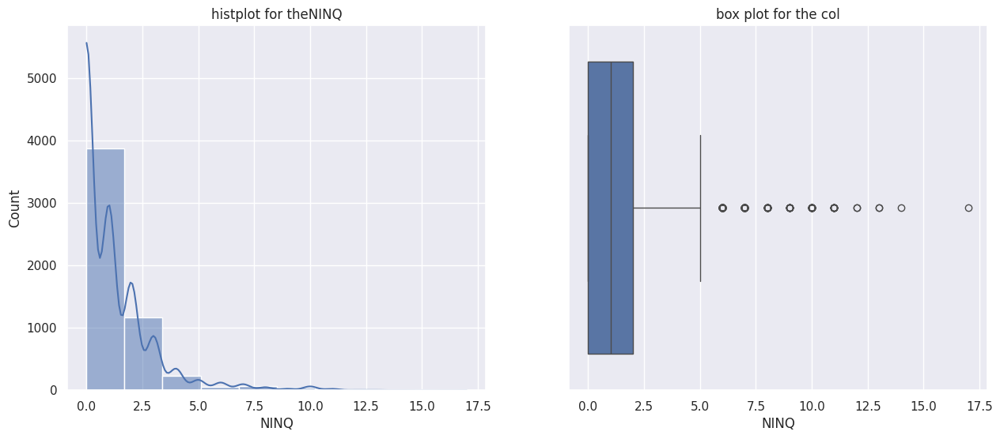

the plots of the CLNO are:
Skew : 0.78


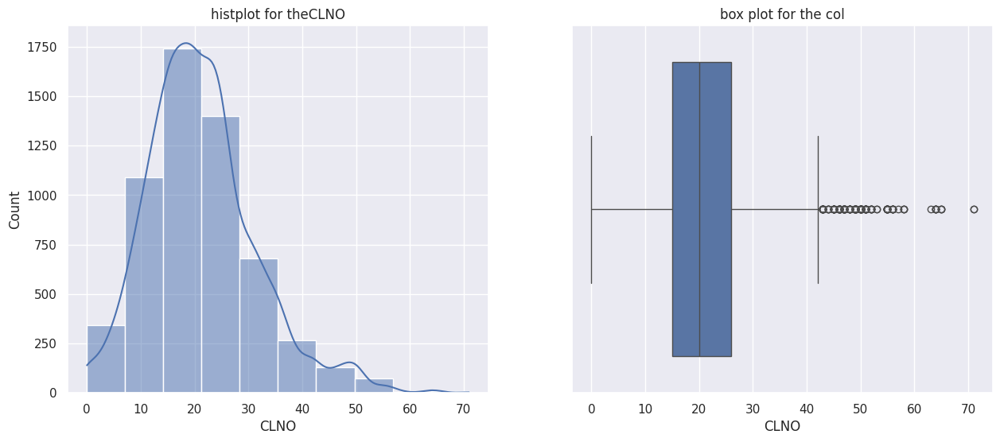

the plots of the DEBTINC are:
Skew : 2.85


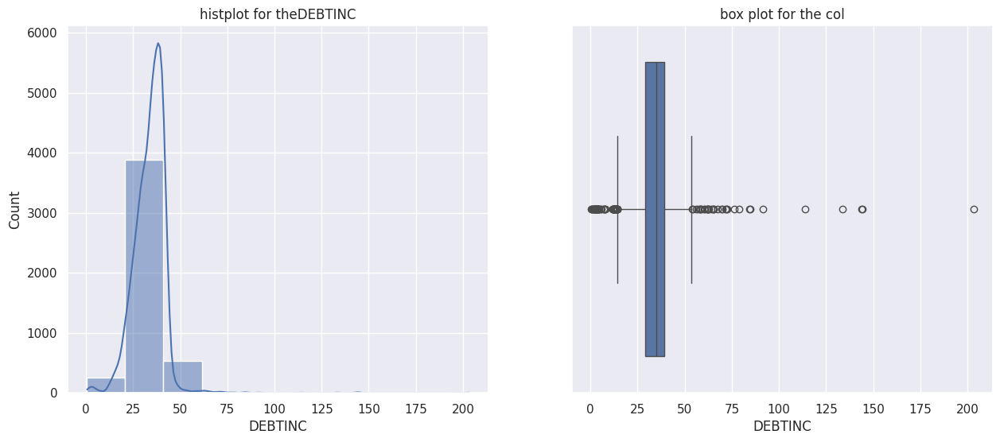

In [95]:
for col in num_cols:
  print(f"the plots of the {col} are:")
  print('Skew :',round(df[col].skew(), 2))
  plt.figure(figsize=(15,6))
  plt.subplot(1,2,1)

  sns.histplot(data=df,x=df[col],bins=10,kde=True)
  plt.title(f"histplot for the{col}")

  plt.subplot(1,2,2)
  sns.boxplot(data=df,x=df[col])
  plt.title(f"box plot for the col")
  plt.show()

  """plt.figure(figsize=(4,4))
  sns.kdeplot(data=df,x=df[col],fill=True)
  plt.title(f"box plot for the col")
  plt.show()"""




## bivariate analysys

<Axes: xlabel='BAD', ylabel='LOAN'>

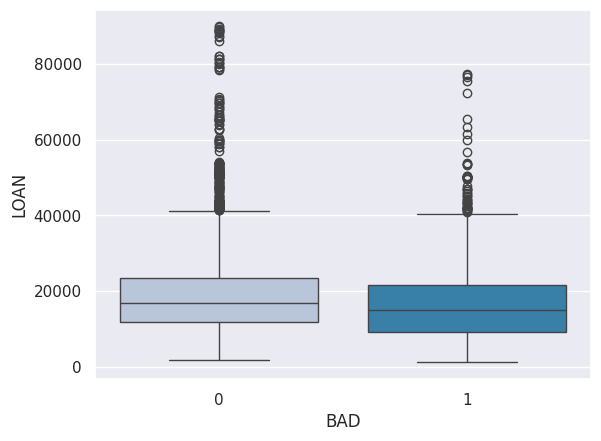

In [96]:
sns.boxplot(x=df["BAD"],y=df["LOAN"],palette="PuBu")

<Axes: xlabel='VALUE', ylabel='MORTDUE'>

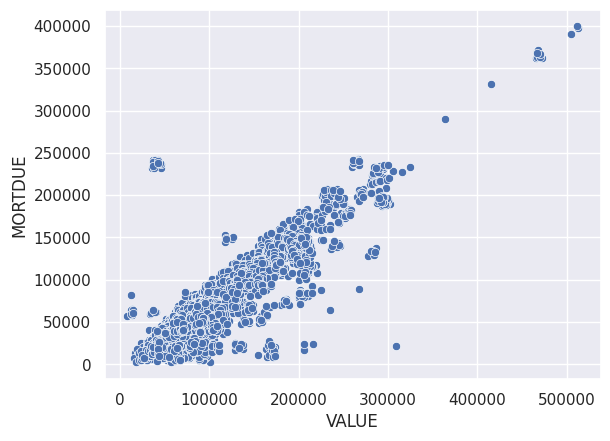

In [97]:
sns.scatterplot(x=df["VALUE"],y=df["MORTDUE"],palette="PuBu")

<Axes: xlabel='LOAN', ylabel='VALUE'>

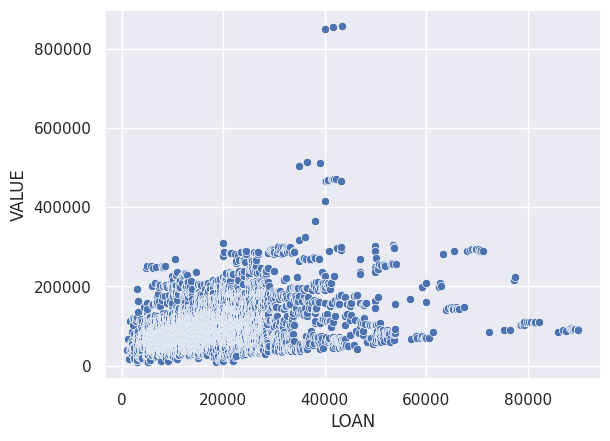

In [98]:
sns.scatterplot(x=df["LOAN"],y=df["VALUE"],palette="PuBu")

In [99]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = df[predictor].nunique()
    sorter = df[target].value_counts().index[-1]
    tab1 = pd.crosstab(df[predictor], df[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(df[predictor], df[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 5, 5))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.xticks(rotation=0)
    plt.show()

BAD         0     1   All
REASON                   
All      4567  1141  5708
DebtCon  3183   745  3928
HomeImp  1384   396  1780
------------------------------------------------------------------------------------------------------------------------


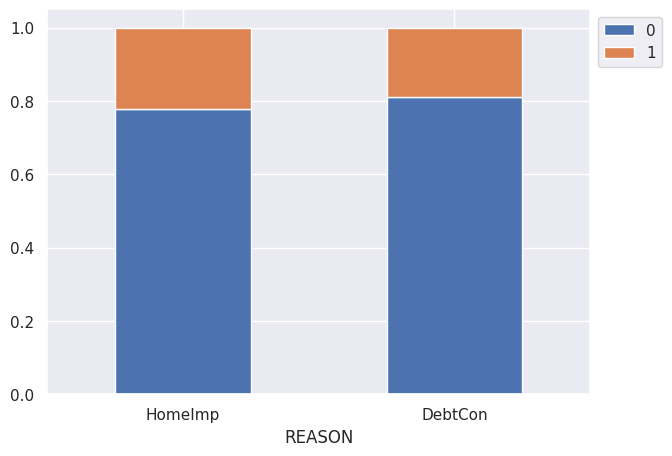

In [100]:
stacked_barplot(df,"REASON","BAD")

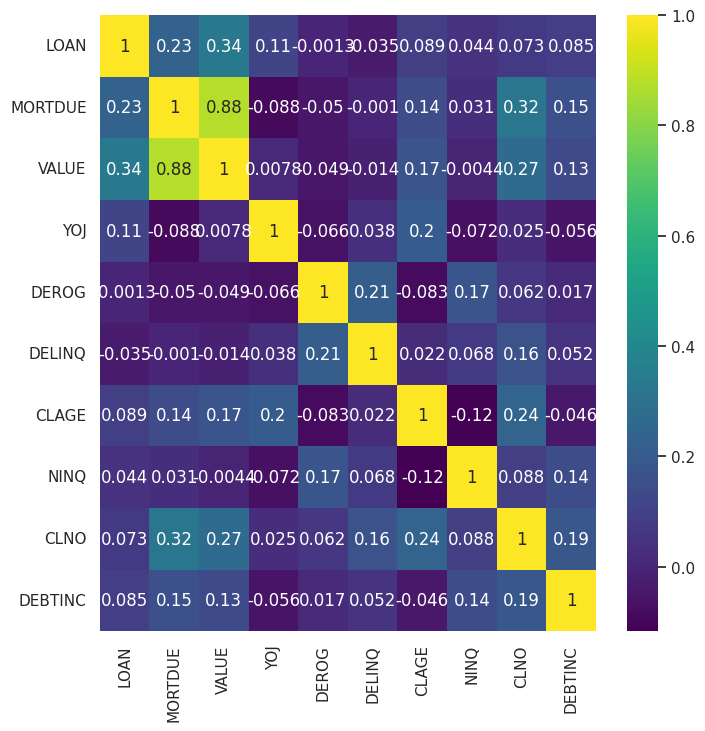

In [101]:
plt.figure(figsize=(8,8))
heat_map=sns.heatmap(df.corr(numeric_only=True),annot=True,cmap="viridis")
heat_map.set_yticklabels(heat_map.get_yticklabels(),rotation=0)
plt.show()

In [102]:
def treat_outliers(df,col):
  q1=df[col].quantile(0.25)
  q3=df[col].quantile(0.75)
  iqr=q3-q1
  lower_whisker=q1-1.5*iqr
  upper_whisker=q3+1.5*iqr
  df=df[(df[col]<=upper_whisker)&(df[col]>=lower_whisker)]
  return df

In [103]:
#def treat_outliers_all(df,col_list):
df_raw=df.copy()
for col in num_cols:
  df=treat_outliers(df_raw,col)
  #return df

In [104]:
def add_binary_flag(df,col):
  new_col=str(col)
  new_col+="_missing_values_flag"
  df[new_col]=df[col].isna().astype(int)
  return df

In [105]:
missing_col=[col for col in df.columns if df[col].isnull().any()]
for column in missing_col:
  add_binary_flag(df,column)

In [106]:
num_data=df.select_dtypes("number")
cat_data=df.select_dtypes("object").columns.tolist()
#replace with median inplace of null values in numerical column
for col in num_data:
  df[col]=df[col].fillna(df[col].median())

for col in cat_data:
  df[col].fillna(df[col].mode()[0],inplace=True)

In [107]:
df.isnull().sum()

,0
BAD,0
LOAN,0
MORTDUE,0
VALUE,0
REASON,174
JOB,210
YOJ,0
DEROG,0
DELINQ,0
CLAGE,0


In [108]:
df.head()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,...,MORTDUE_missing_values_flag,VALUE_missing_values_flag,REASON_missing_values_flag,JOB_missing_values_flag,YOJ_missing_values_flag,DEROG_missing_values_flag,DELINQ_missing_values_flag,CLAGE_missing_values_flag,NINQ_missing_values_flag,CLNO_missing_values_flag
5,1,1700,30548.0,40320.0,HomeImp,Other,9.0,0.0,0.0,101.466002,...,0,0,0,0,0,0,0,0,0,0
7,1,1800,28502.0,43034.0,HomeImp,Other,11.0,0.0,0.0,88.766030,...,0,0,0,0,0,0,0,0,0,0
19,0,2300,102370.0,120953.0,HomeImp,Office,2.0,0.0,0.0,90.992533,...,0,0,0,0,0,0,0,0,0,0
25,1,2400,34863.0,47471.0,HomeImp,Mgr,12.0,0.0,0.0,70.491080,...,0,0,0,0,0,0,0,0,0,0
26,0,2400,98449.0,117195.0,HomeImp,Office,4.0,0.0,0.0,93.811775,...,0,0,0,0,0,0,0,0,0,0


In [109]:
df.tail()

,BAD,LOAN,MORTDUE,VALUE,REASON,JOB,YOJ,DEROG,DELINQ,CLAGE,...,MORTDUE_missing_values_flag,VALUE_missing_values_flag,REASON_missing_values_flag,JOB_missing_values_flag,YOJ_missing_values_flag,DEROG_missing_values_flag,DELINQ_missing_values_flag,CLAGE_missing_values_flag,NINQ_missing_values_flag,CLNO_missing_values_flag
5955,0,88900,57264.0,90185.0,DebtCon,Other,16.0,0.0,0.0,221.808718,...,0,0,0,0,0,0,0,0,0,0
5956,0,89000,54576.0,92937.0,DebtCon,Other,16.0,0.0,0.0,208.692070,...,0,0,0,0,0,0,0,0,0,0
5957,0,89200,54045.0,92924.0,DebtCon,Other,15.0,0.0,0.0,212.279697,...,0,0,0,0,0,0,0,0,0,0
5958,0,89800,50370.0,91861.0,DebtCon,Other,14.0,0.0,0.0,213.892709,...,0,0,0,0,0,0,0,0,0,0
5959,0,89900,48811.0,88934.0,DebtCon,Other,15.0,0.0,0.0,219.601002,...,0,0,0,0,0,0,0,0,0,0


In [110]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4599 entries, 5 to 5959
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   BAD                          4599 non-null   category
 1   LOAN                         4599 non-null   int64   
 2   MORTDUE                      4599 non-null   float64 
 3   VALUE                        4599 non-null   float64 
 4   REASON                       4425 non-null   category
 5   JOB                          4389 non-null   category
 6   YOJ                          4599 non-null   float64 
 7   DEROG                        4599 non-null   float64 
 8   DELINQ                       4599 non-null   float64 
 9   CLAGE                        4599 non-null   float64 
 10  NINQ                         4599 non-null   float64 
 11  CLNO                         4599 non-null   float64 
 12  DEBTINC                      4599 non-null   float64 
 13  MORTDUE_

In [111]:
#droping missing flags
bool_cols=df.select_dtypes(["bool"]).columns.tolist()
X=df.drop(columns=bool_cols)

In [112]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4599 entries, 5 to 5959
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype   
---  ------                       --------------  -----   
 0   BAD                          4599 non-null   category
 1   LOAN                         4599 non-null   int64   
 2   MORTDUE                      4599 non-null   float64 
 3   VALUE                        4599 non-null   float64 
 4   REASON                       4425 non-null   category
 5   JOB                          4389 non-null   category
 6   YOJ                          4599 non-null   float64 
 7   DEROG                        4599 non-null   float64 
 8   DELINQ                       4599 non-null   float64 
 9   CLAGE                        4599 non-null   float64 
 10  NINQ                         4599 non-null   float64 
 11  CLNO                         4599 non-null   float64 
 12  DEBTINC                      4599 non-null   float64 
 13  MORTDUE_

In [113]:
df.columns

Index(['BAD', 'LOAN', 'MORTDUE', 'VALUE', 'REASON', 'JOB', 'YOJ', 'DEROG',
       'DELINQ', 'CLAGE', 'NINQ', 'CLNO', 'DEBTINC',
       'MORTDUE_missing_values_flag', 'VALUE_missing_values_flag',
       'REASON_missing_values_flag', 'JOB_missing_values_flag',
       'YOJ_missing_values_flag', 'DEROG_missing_values_flag',
       'DELINQ_missing_values_flag', 'CLAGE_missing_values_flag',
       'NINQ_missing_values_flag', 'CLNO_missing_values_flag'],
      dtype='object')

## model building approach

In [114]:
x=df.drop(columns=["BAD"],axis=1)
y=df["BAD"]

to_get_dummies_for=["REASON","JOB"]
X=pd.get_dummies(data=x,columns=to_get_dummies_for,drop_first=True)

In [115]:
X

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,...,DELINQ_missing_values_flag,CLAGE_missing_values_flag,NINQ_missing_values_flag,CLNO_missing_values_flag,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
5,1700,30548.0,40320.0,9.0,0.0,0.0,101.466002,1.0,8.0,37.113614,...,0,0,0,0,True,False,True,False,False,False
7,1800,28502.0,43034.0,11.0,0.0,0.0,88.766030,0.0,8.0,36.884894,...,0,0,0,0,True,False,True,False,False,False
19,2300,102370.0,120953.0,2.0,0.0,0.0,90.992533,0.0,13.0,31.588503,...,0,0,0,0,True,True,False,False,False,False
25,2400,34863.0,47471.0,12.0,0.0,0.0,70.491080,1.0,21.0,38.263601,...,0,0,0,0,True,False,False,False,False,False
26,2400,98449.0,117195.0,4.0,0.0,0.0,93.811775,0.0,13.0,29.681827,...,0,0,0,0,True,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5955,88900,57264.0,90185.0,16.0,0.0,0.0,221.808718,0.0,16.0,36.112347,...,0,0,0,0,False,False,True,False,False,False
5956,89000,54576.0,92937.0,16.0,0.0,0.0,208.692070,0.0,15.0,35.859971,...,0,0,0,0,False,False,True,False,False,False
5957,89200,54045.0,92924.0,15.0,0.0,0.0,212.279697,0.0,15.0,35.556590,...,0,0,0,0,False,False,True,False,False,False
5958,89800,50370.0,91861.0,14.0,0.0,0.0,213.892709,0.0,16.0,34.340882,...,0,0,0,0,False,False,True,False,False,False


## scaling

In [116]:
sc=StandardScaler()
X_scaled=sc.fit_transform(X)
X_scaled=pd.DataFrame(X_scaled,columns=X.columns)

In [117]:
X_scaled

,LOAN,MORTDUE,VALUE,YOJ,DEROG,DELINQ,CLAGE,NINQ,CLNO,DEBTINC,...,DELINQ_missing_values_flag,CLAGE_missing_values_flag,NINQ_missing_values_flag,CLNO_missing_values_flag,REASON_HomeImp,JOB_Office,JOB_Other,JOB_ProfExe,JOB_Sales,JOB_Self
0,-1.569563,-1.045421,-1.115561,0.020021,-0.244258,-0.340053,-0.985421,0.029565,-1.380856,0.502702,...,-0.337386,-0.215997,-0.31285,-0.189237,1.557875,-0.451233,1.241889,-0.531159,-0.130491,-0.173902
1,-1.560585,-1.093882,-1.067681,0.295293,-0.244258,-0.340053,-1.137482,-0.617906,-1.380856,0.468243,...,-0.337386,-0.215997,-0.31285,-0.189237,1.557875,-0.451233,1.241889,-0.531159,-0.130491,-0.173902
2,-1.515697,0.655756,0.306933,-0.943428,-0.244258,-0.340053,-1.110824,-0.617906,-0.862655,-0.329712,...,-0.337386,-0.215997,-0.31285,-0.189237,1.557875,2.216148,-0.805225,-0.531159,-0.130491,-0.173902
3,-1.506719,-0.943215,-0.989406,0.432928,-0.244258,-0.340053,-1.356295,0.029565,-0.033533,0.675959,...,-0.337386,-0.215997,-0.31285,-0.189237,1.557875,-0.451233,-0.805225,-0.531159,-0.130491,-0.173902
4,-1.506719,0.562883,0.240636,-0.668157,-0.244258,-0.340053,-1.077068,-0.617906,-0.862655,-0.616972,...,-0.337386,-0.215997,-0.31285,-0.189237,1.557875,2.216148,-0.805225,-0.531159,-0.130491,-0.173902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4594,6.258971,-0.412625,-0.235863,0.983471,-0.244258,-0.340053,0.455488,-0.617906,-0.551734,0.351851,...,-0.337386,-0.215997,-0.31285,-0.189237,-0.641900,-0.451233,1.241889,-0.531159,-0.130491,-0.173902
4595,6.267948,-0.476293,-0.187313,0.983471,-0.244258,-0.340053,0.298437,-0.617906,-0.655374,0.313828,...,-0.337386,-0.215997,-0.31285,-0.189237,-0.641900,-0.451233,1.241889,-0.531159,-0.130491,-0.173902
4596,6.285904,-0.488870,-0.187543,0.845835,-0.244258,-0.340053,0.341393,-0.617906,-0.655374,0.268121,...,-0.337386,-0.215997,-0.31285,-0.189237,-0.641900,-0.451233,1.241889,-0.531159,-0.130491,-0.173902
4597,6.339770,-0.575917,-0.206296,0.708200,-0.244258,-0.340053,0.360707,-0.617906,-0.551734,0.084962,...,-0.337386,-0.215997,-0.31285,-0.189237,-0.641900,-0.451233,1.241889,-0.531159,-0.130491,-0.173902


In [118]:
x_train,x_test,y_train,y_test=train_test_split(X_scaled,y,test_size=0.3,random_state=1,stratify=y)

In [119]:
def metrics_score(actual,predicted):
  print(classification_report(actual,predicted))
  cm=confusion_matrix(actual,predicted)
  group_names=["True Neg","False Pos","False Neg","True Pos"]
  group_counts=["{0:0.0f}".format(value) for value in cm.flatten()]
  group_percentages=["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
  labels=[f"{v1}\n{v2}\n{v3}" for v1,v2,v3 in zip(group_names,group_counts,group_percentages)]
  labels=np.asarray(labels).reshape(2,2)
  plt.figure(figsize=(6,4))
  sns.heatmap(cm,annot=labels,fmt="",xticklabels=["Not Eligible", "Eligible"],yticklabels=["Not Eligible", "Eligible"],cmap="Greens")
  plt.ylabel("Actual")
  plt.xlabel("Predicted")
  plt.show()


In [120]:
def model_performance_classification(model,predictors,target):
  print(f"the performance of the {model}..........")
  pred=model.predict(predictors)
  recall=recall_score(target,pred)
  precision=precision_score(target,pred)
  acc=accuracy_score(target,pred)
  df_perf=pd.DataFrame(
      {"precision": precision,
       "recall": recall,
       "accuracy":acc,

      },
      index=[0]
  )
  return df_perf

In [121]:
lg=LogisticRegression()
lg.fit(x_train,y_train)

LogisticRegression()

              precision    recall  f1-score   support

           0       0.94      1.00      0.97      2971
           1       0.81      0.20      0.32       248

    accuracy                           0.93      3219
   macro avg       0.87      0.60      0.64      3219
weighted avg       0.93      0.93      0.92      3219



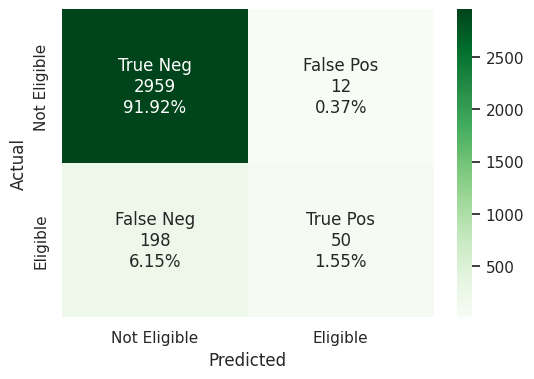

In [122]:
y_pred_train=lg.predict(x_train)
metrics_score(y_train,y_pred_train)

              precision    recall  f1-score   support

           0       0.93      0.99      0.96      1274
           1       0.70      0.15      0.25       106

    accuracy                           0.93      1380
   macro avg       0.81      0.57      0.61      1380
weighted avg       0.92      0.93      0.91      1380



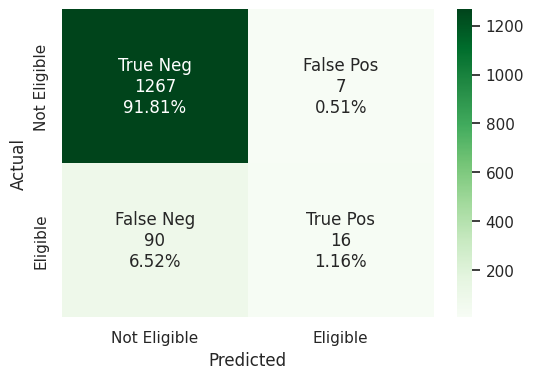

In [123]:
y_pred_test=lg.predict(x_test)
metrics_score(y_test,y_pred_test)

In [124]:
lg_test=model_performance_classification(lg,x_test,y_test)
lg_test

the performance of the LogisticRegression()..........


,precision,recall,accuracy
0,0.695652,0.150943,0.92971


In [125]:
cols=X_scaled.columns
coef_lg=lg.coef_
pd.DataFrame(coef_lg,columns=cols).T.sort_values(by=0,ascending=False)

,0
DEBTINC,0.717591
DELINQ,0.561771
VALUE_missing_values_flag,0.480017
CLNO_missing_values_flag,0.392791
CLAGE_missing_values_flag,0.353350
DEROG,0.345981
VALUE,0.332289
MORTDUE_missing_values_flag,0.263836
JOB_Sales,0.123708
JOB_Other,0.108928


In [126]:
odds=np.exp(lg.coef_[0])
pd.DataFrame(odds,x_train.columns,columns=["odds"]).sort_values(by="odds",ascending=False)

,odds
DEBTINC,2.049490
DELINQ,1.753776
VALUE_missing_values_flag,1.616102
CLNO_missing_values_flag,1.481109
CLAGE_missing_values_flag,1.423829
DEROG,1.413376
VALUE,1.394155
MORTDUE_missing_values_flag,1.301915
JOB_Sales,1.131685
JOB_Other,1.115082


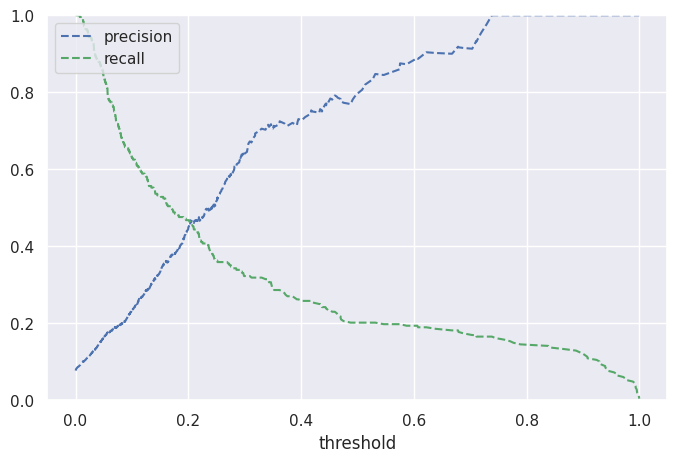

In [127]:
y_scores_lg=lg.predict_proba(x_train)
precisions_lg,recalls_lg,thresholds_lg=precision_recall_curve(y_train,y_scores_lg[:,1])
plt.figure(figsize=(8,5))
plt.plot(thresholds_lg,precisions_lg[:-1],'b--',label="precision")
plt.plot(thresholds_lg,recalls_lg[:-1],"g--",label="recall")
plt.xlabel("threshold")
plt.legend(loc="upper left")
plt.ylim([0,1])
plt.show()


              precision    recall  f1-score   support

           0       0.95      0.98      0.96      2971
           1       0.55      0.36      0.43       248

    accuracy                           0.93      3219
   macro avg       0.75      0.67      0.70      3219
weighted avg       0.92      0.93      0.92      3219



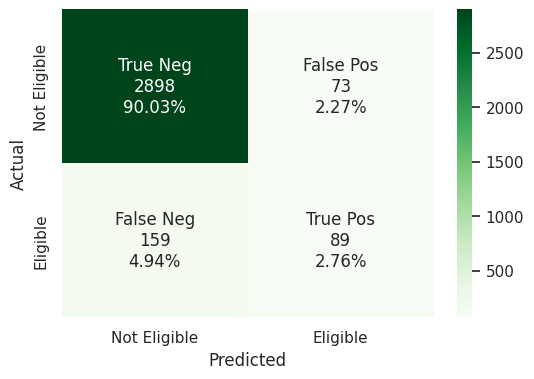

In [128]:
optimal_threshold1=.26
y_pred_train=lg.predict_proba(x_train)
metrics_score(y_train,y_pred_train[:,1]>optimal_threshold1)

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      1274
           1       0.55      0.34      0.42       106

    accuracy                           0.93      1380
   macro avg       0.75      0.66      0.69      1380
weighted avg       0.92      0.93      0.92      1380



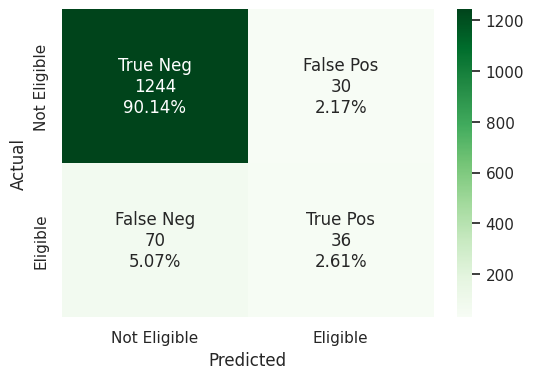

In [129]:
optimal_threshold1=0.26
y_pred_test=lg.predict_proba(x_test)
metrics_score(y_test,y_pred_test[:,1]>optimal_threshold1)

## decision tree

In [130]:
dt=DecisionTreeClassifier(class_weight={0:0.2,1:0.8},random_state=1)
dt.fit(x_train,y_train)

DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2971
           1       1.00      1.00      1.00       248

    accuracy                           1.00      3219
   macro avg       1.00      1.00      1.00      3219
weighted avg       1.00      1.00      1.00      3219



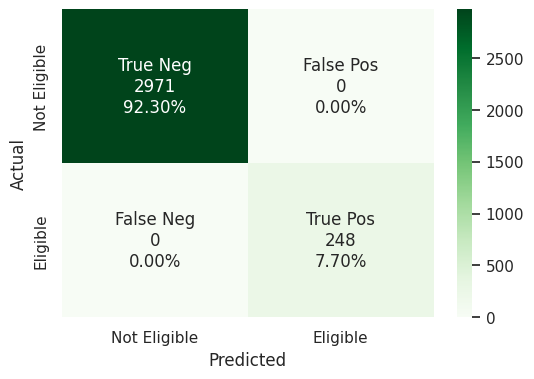

In [131]:
y_train_pred_dt=dt.predict(x_train)
metrics_score(y_train,y_train_pred_dt)

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      1274
           1       0.60      0.40      0.48       106

    accuracy                           0.93      1380
   macro avg       0.78      0.69      0.72      1380
weighted avg       0.92      0.93      0.93      1380



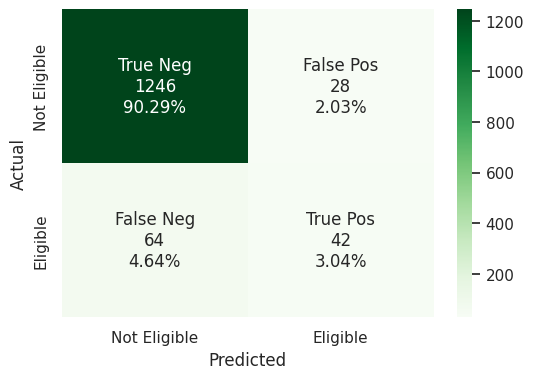

In [132]:
y_pred_test_dt=dt.predict(x_test)
metrics_score(y_test,y_pred_test_dt)

In [133]:
dtree=model_performance_classification(dt,x_test,y_test)
dtree

the performance of the DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, random_state=1)..........


,precision,recall,accuracy
0,0.6,0.396226,0.933333


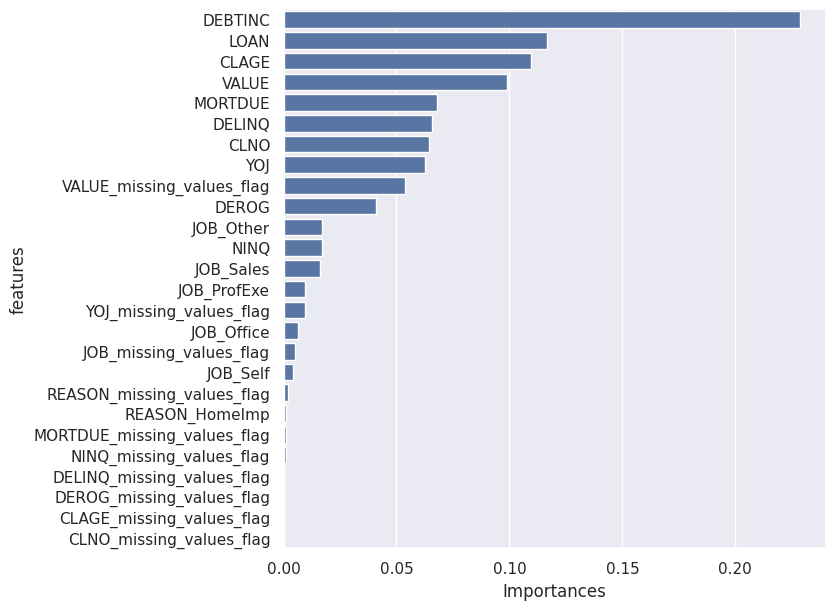

In [134]:
importances=dt.feature_importances_
cols=X_scaled.columns
importance_df=pd.DataFrame({"Importances":importances,"features":cols}).sort_values(by="Importances",ascending=False)
plt.figure(figsize=(7,7))
sns.barplot(x=importance_df["Importances"],y=importance_df["features"])
plt.show()


In [135]:
d_tree_tuned=DecisionTreeClassifier(class_weight={0:0.2,1:0.8},random_state=1)

param_grid={
    "max_depth":np.arange(2,7),
    "criterion":["gini","entropy"],
    "min_samples_leaf":[5,10,20,25]
}

scorer=metrics.make_scorer(recall_score,pos_label=1)

gridCV=GridSearchCV(estimator=d_tree_tuned,param_grid=param_grid,
                    scoring=scorer,cv=10)
gridCV=gridCV.fit(x_train,y_train)

d_tree_tunder=gridCV.best_estimator_

d_tree_tuned.fit(x_train,y_train)





DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2971
           1       1.00      1.00      1.00       248

    accuracy                           1.00      3219
   macro avg       1.00      1.00      1.00      3219
weighted avg       1.00      1.00      1.00      3219



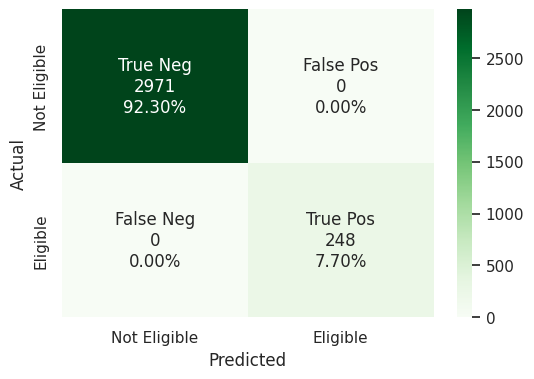

In [136]:
y_train_pred_dt=d_tree_tuned.predict(x_train)
metrics_score(y_train,y_train_pred_dt)

              precision    recall  f1-score   support

           0       0.95      0.98      0.96      1274
           1       0.60      0.40      0.48       106

    accuracy                           0.93      1380
   macro avg       0.78      0.69      0.72      1380
weighted avg       0.92      0.93      0.93      1380



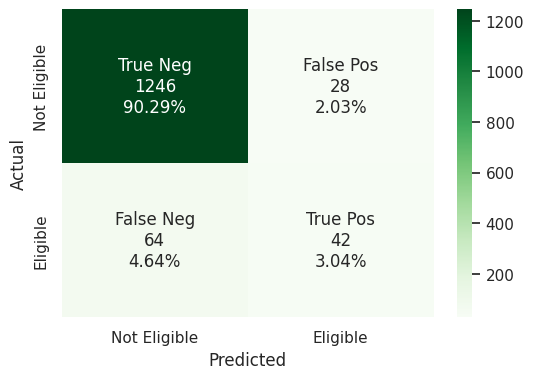

In [137]:
x_test_pred_dt=d_tree_tuned.predict(x_test)
metrics_score(y_test,x_test_pred_dt)

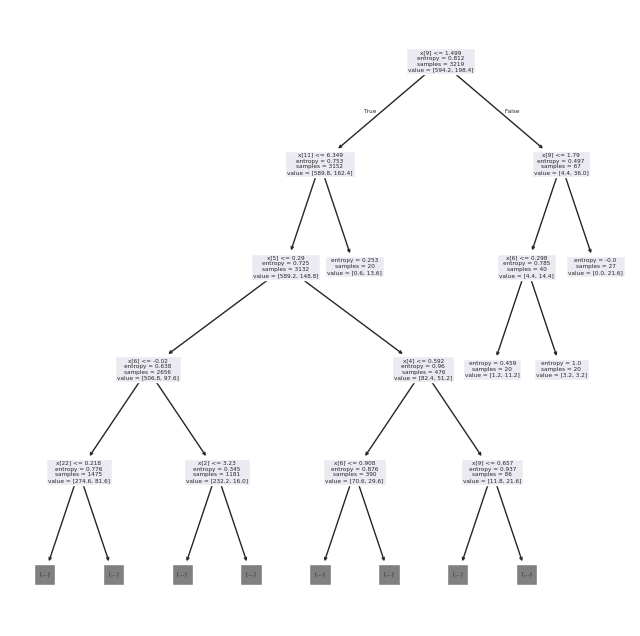

In [138]:
from sklearn.tree import plot_tree
plt.figure(figsize=(8,8))
plot_tree(d_tree_tunder,max_depth=4)
plt.show()